# 🧪 Data Exploration Notebook
This notebook explores multi-dimensional datasets and visualizes their statistical patterns.

In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations
from sklearn.decomposition import PCA

plt.style.use("seaborn-v0_8-whitegrid")

DATA_DIMENSIONS = [10, 12, 14, 16, 18, 20]
DATA_PATH = "data"


## 📥 Select dataset dimension

In [2]:
dim = 10  # Choose from: 10, 12, 14, 16, 18, 20

X_path = os.path.join(DATA_PATH, f"kryptonite-{dim}-X.npy")
y_path = os.path.join(DATA_PATH, f"kryptonite-{dim}-y.npy")

if not (os.path.exists(X_path) and os.path.exists(y_path)):
    raise FileNotFoundError(f"Data not found: {X_path} or {y_path}")

X = np.load(X_path)
y = np.load(y_path)
df = pd.DataFrame(X, columns=[f"f{i+1}" for i in range(X.shape[1])])
df.head()

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10
0,1.187888,1.214287,0.908479,0.215856,0.203282,1.022097,-0.075807,-0.002180,0.127300,-0.007851
1,-0.141532,-0.154812,0.994477,0.980741,1.058951,-0.087281,0.952201,0.946226,-0.020900,0.995703
2,1.005807,-0.114741,0.951154,0.117097,-0.045550,1.044222,0.003008,0.087523,1.167185,-0.027434
3,1.113041,0.869040,1.001452,0.833202,0.927219,-0.151415,0.171125,0.799642,-0.191939,0.145807
4,1.109334,0.250857,0.016202,0.821271,1.170598,-0.083242,1.087080,-0.120940,-0.063181,-0.058706


## 📊 Feature Distributions

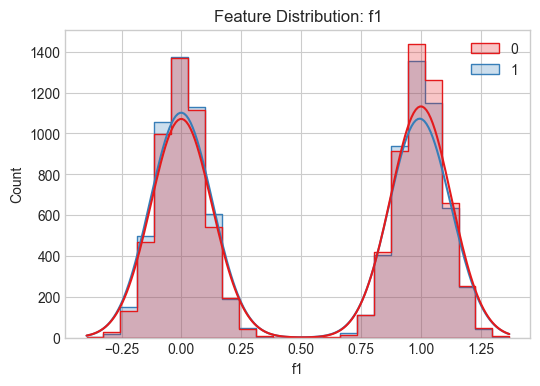

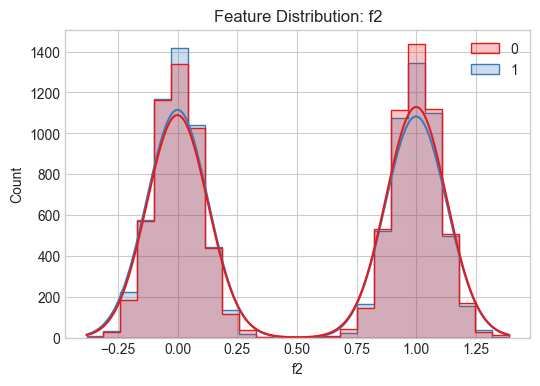

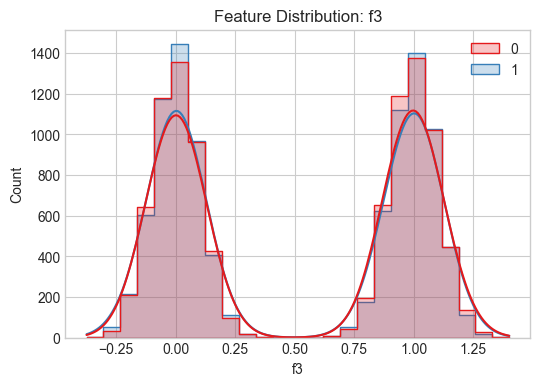

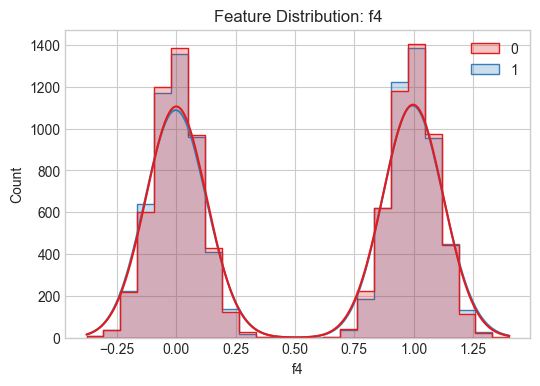

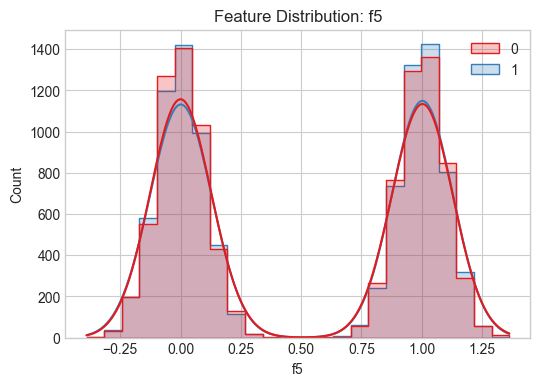

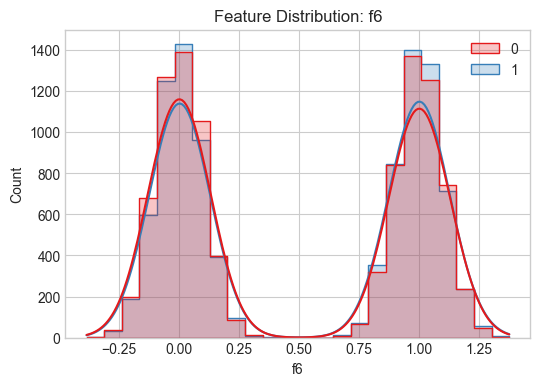

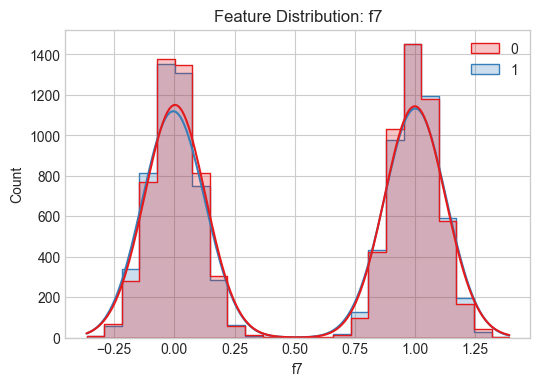

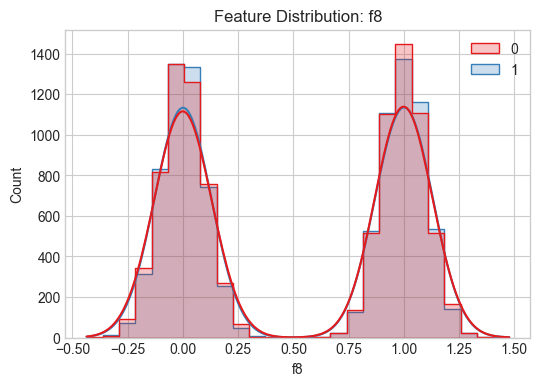

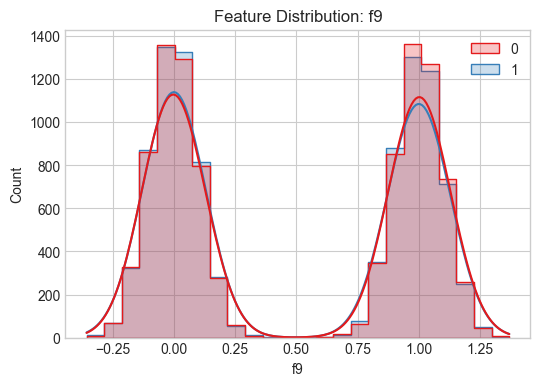

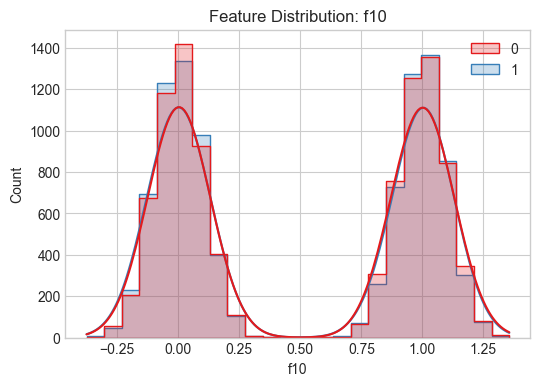

In [3]:
for col in df.columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(data=df, x=col, hue=y, kde=True, element="step", palette="Set1")
    plt.title(f"Feature Distribution: {col}")
    plt.show()

## 🔥 Feature Correlation Heatmap

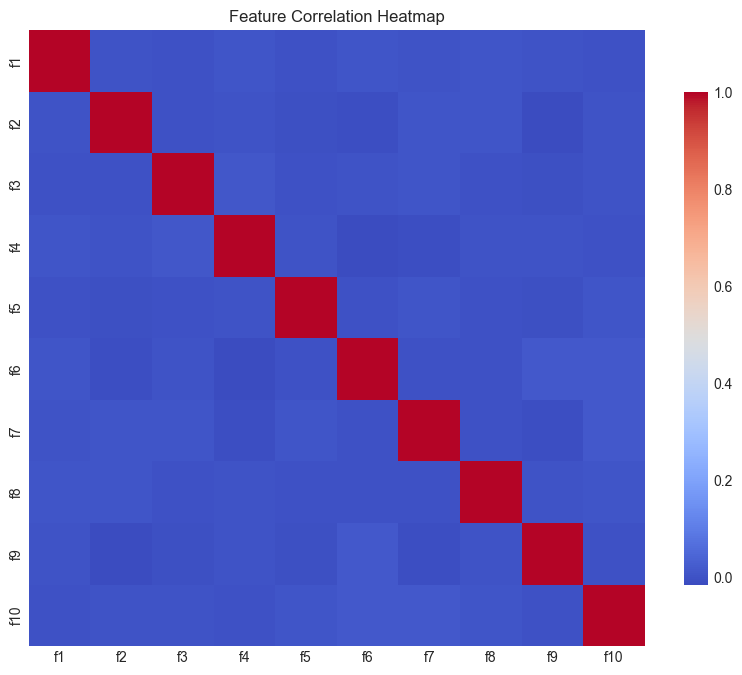

In [4]:
corr = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=False, cmap="coolwarm", square=True, cbar_kws={"shrink": 0.8})
plt.title("Feature Correlation Heatmap")
plt.show()

## 🎯 PCA Visualization

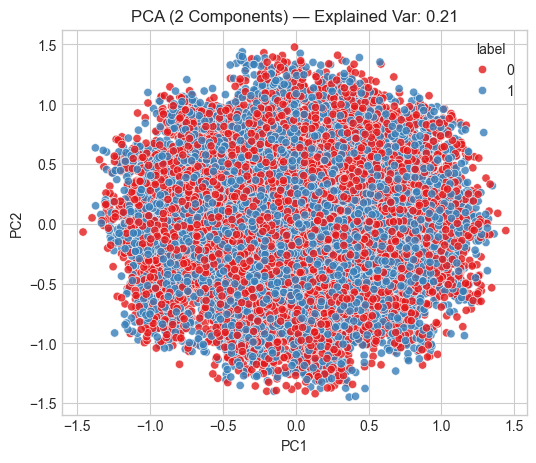

In [5]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df)
df_pca = pd.DataFrame(X_pca, columns=["PC1", "PC2"])
df_pca["label"] = y

plt.figure(figsize=(6, 5))
sns.scatterplot(data=df_pca, x="PC1", y="PC2", hue="label", palette="Set1", alpha=0.8)
explained_var = pca.explained_variance_ratio_.sum()
plt.title(f"PCA (2 Components) — Explained Var: {explained_var:.2f}")
plt.show()

## 🔍 Pairplot (Feature Interaction Overview)

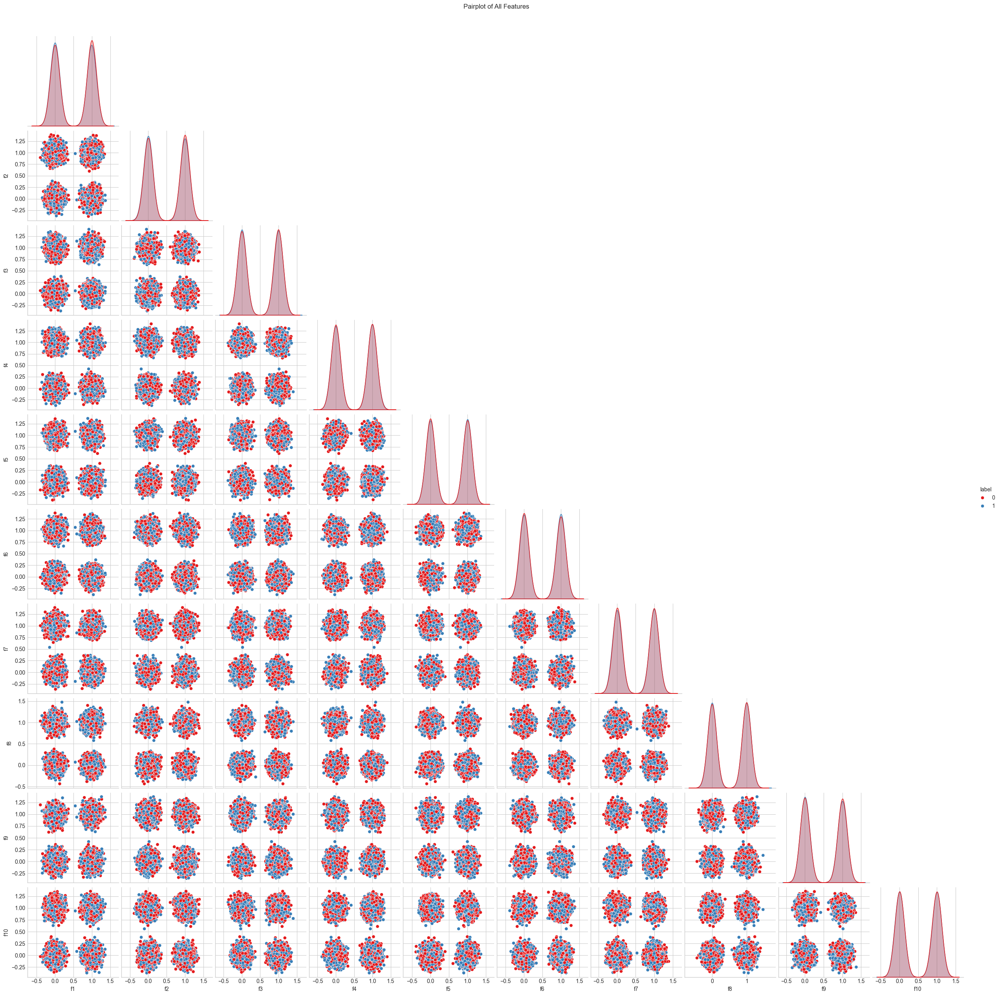

In [6]:
df_copy = df.copy()
df_copy["label"] = y
sns.pairplot(df_copy, hue="label", corner=True, palette="Set1", diag_kind="kde")
plt.suptitle("Pairplot of All Features", y=1.02)
plt.show()

## 📌 2D Feature Scatter Plots

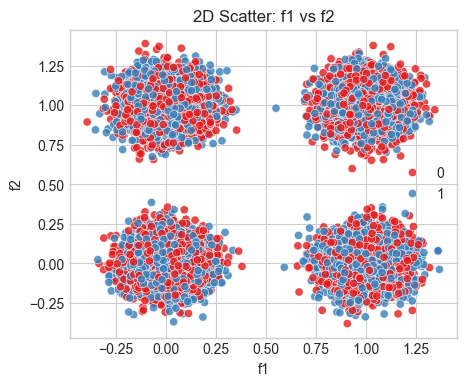

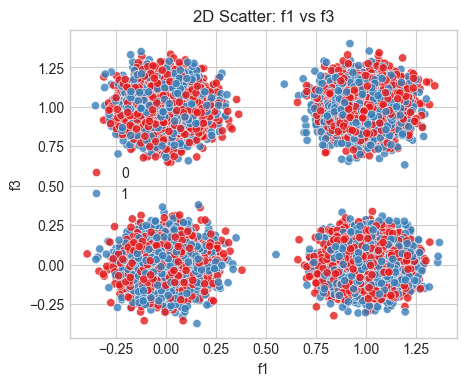

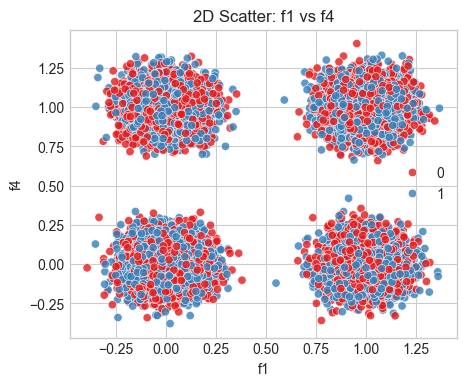

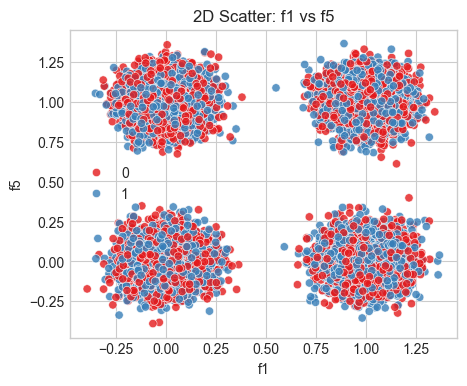

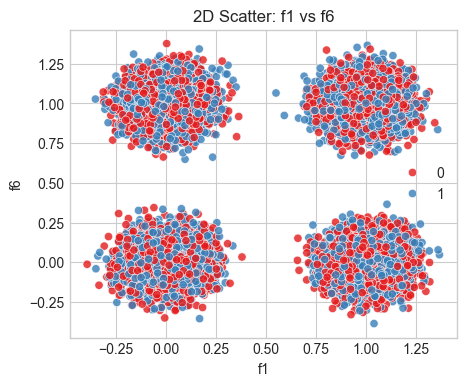

...

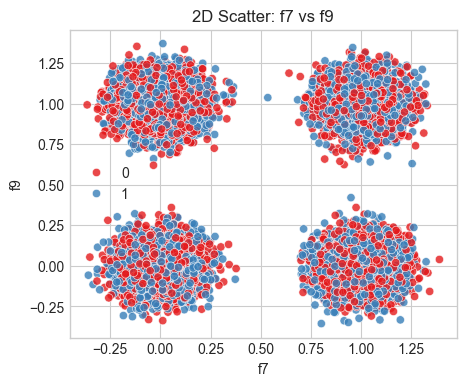

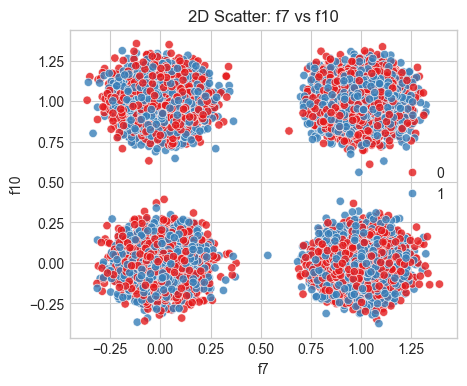

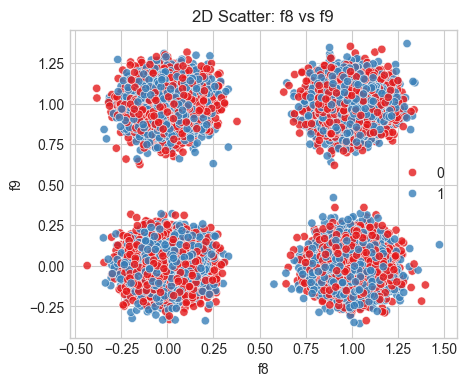

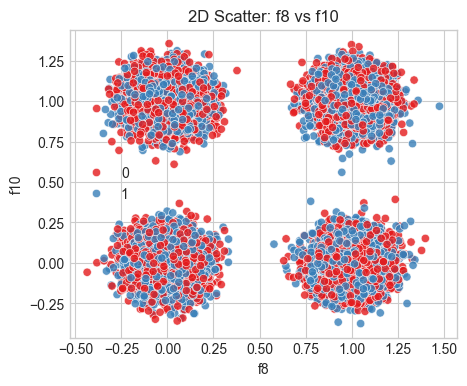

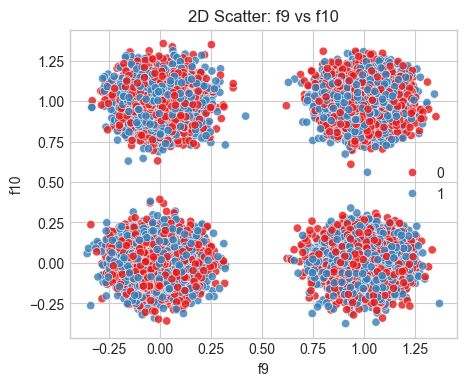

In [7]:
feature_pairs = list(combinations(df.columns, 2))
for (f1, f2) in feature_pairs:
    plt.figure(figsize=(5, 4))
    sns.scatterplot(x=df[f1], y=df[f2], hue=y, palette="Set1", alpha=0.8)
    plt.title(f"2D Scatter: {f1} vs {f2}")
    plt.show()